# <center> Face mask detection

**Case Description**

In this work, a deep learning based model for detecting masks over faces in public place to curtail community spread of Coronavirus is presented.

**Task**
* Using the data to build Face mask detection model (CV task)

**Data**: Dataset consists of 2 folders - *annotations* and *images* of faces with mask or without.

**Metrics**: mAP(mAP_50)

**Computer Vision algorithms**:
- Using pretrained Faster R-CNN model (Faster RCNN ResNet50 FPN V2)
- Using pretrained YOLO model (Yolov8)

*Training on GPU (Kaggle resources)*

*Note: Images classification is an example of supervised machine learning since we train the model with labelled data.*

# 0. Install and Import

In [1]:
%%capture
!pip install torchmetrics[detection]

In [2]:
import os
import glob
import numpy as np # linear algebra
import pandas as pd
import shutil as sh
import random

from PIL import Image
# from IPython.display import Image

# for reading xml file
import xml.etree.ElementTree as ET
from lxml import etree

# from tqdm import tqdm_notebook as tqdm
from tqdm.notebook import tqdm

# Libs for Visualisation
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches # A patch is a 2D artist with a face color and an edge color

from sklearn import preprocessing
from sklearn.model_selection import train_test_split

import cv2
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

# PyTorch libs
import torch
import torchvision
from torchvision import transforms, datasets, models
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchmetrics.detection.mean_ap import MeanAveragePrecision

import warnings
warnings.filterwarnings("ignore")

In [3]:
# %%capture
# # to download publicly available files and folders from Google Drive
# !pip install gdown


# import gdown
# import zipfile

In [4]:
"""
Set random seeds

Helper function for reproducible behavior to set the seed in ``random``, ``numpy``, ``torch`` and/or ``tf`` (if installed).
Args:
    seed (:obj:`int`): The seed to set
"""
def set_seed(seed: int = 42):
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    
set_seed()

In [5]:
# Fixing RANDOM_SEED to make experiment repetable
RANDOM_SEED = 42

In [6]:
# Fixing package versions to make experiment repetable
!pip freeze > requirements.txt

In [7]:
# Check available device
print(torch.cuda.is_available())

# Device name
print(torch.cuda.get_device_name(0))

True
Tesla T4


# 1. Data Loading: dataset exploration

In [8]:
"""
The first step in any ML tasks is create dataset for further work.
Images are the key element for Computer Vision projects.

Firtsly, we need to download dataset from Google Drive to local path or from Kaggle sources
"""
# output = "PROJECT_2_archive.zip"
# id = "1m8KfDi4M8pFzrfVIKNEb9rAzUJGJ-xhN"
# gdown.download(id=id, output=output, quiet=False)

# """
# Unzip data
# """
# ROOT = "/kaggle/working/data"
# zip_path = "/kaggle/working/PROJECT_2_archive.zip"

# with zipfile.ZipFile(zip_path, "r") as zip_ref:
#     zip_ref.extractall(ROOT)

# Let's check it
!ls /kaggle/input/face-mask-detection

annotations  images


The /kaggle/input directory is only used for reading files. The directory is read-only, so no files can be written to it.

That's why I need to move Dataset folder to /kaggle/working directory. The /kaggle/working directory is used to store output files (e.g. .txt, .csv, .json, .xml, etc).

In [9]:
# make copy of dataset from input folder to working folder
!cp -r "/kaggle/input/face-mask-detection" "/kaggle/working"

In [10]:
# Let's check working directory
!ls /kaggle/working

face-mask-detection  requirements.txt


In [11]:
ROOT = "/kaggle/working/face-mask-detection"
ANNOTATIONS = "annotations"
IMAGES = "images"

files_ann = list(glob.glob(f"{ROOT}/{ANNOTATIONS}/*"))
files_img = list(glob.glob(f"{ROOT}/{IMAGES}/*"))

print(f"Number of annotations in dataset: {len(files_ann)}")
print(f"Number of images in dataset: {len(files_ann)}")

Number of annotations in dataset: 853
Number of images in dataset: 853


So, after checking dataset we see that the number of annotations and images is equal (853) and meets the conditions of the task.

***

Let's use`imshow()` method to display data as an image.

As a result we get numpy array with (HEIGHT, WIDTH, CHANNEL) dimension:

* HEIGHT — height of images (in pixels);
* WIDTH — width of images (in pixels);
* CHANNEL — channels number.

All images in the dataset are in color and have 3 channels - **RGB** (Red, Green, Blue). The values of each of the three matrices are the pixel intensity values that range from 0 to 255.

Image shape: (287, 510, 3)


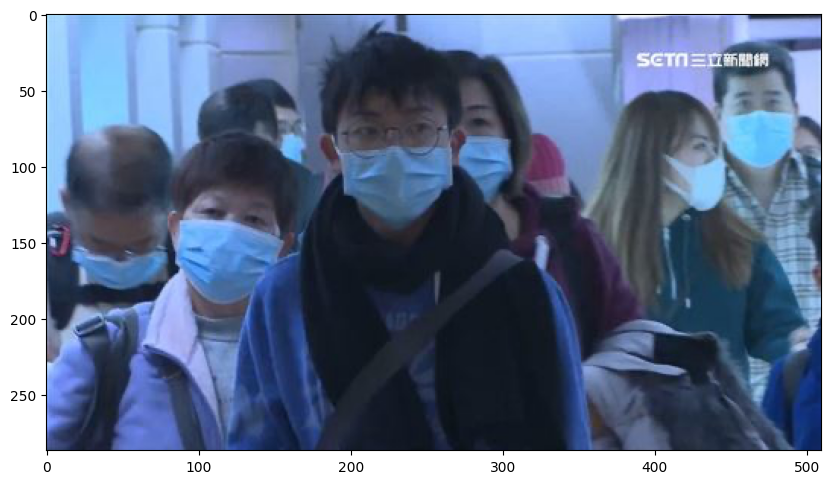

In [12]:
# File path
image_filename = "maksssksksss573.png"
image_path = os.path.join(f"{ROOT}/{IMAGES}/", image_filename)

# Image reading
img = plt.imread(image_path)

# Create a figure and coordinate plane
fig, ax = plt.subplots(figsize=(10, 8))

# Printing image to the screen
ax.imshow(img);

# Image's size
print(f"Image shape: {img.shape}")

In [13]:
"""
Pixel intensity values are range from 0 to 1 if we use matplotlib.

So, I can check it
"""
print(img)

[[[0.63529414 0.8392157  0.93333334]
  [0.68235296 0.88235295 0.9882353 ]
  [0.6431373  0.84313726 0.9647059 ]
  ...
  [0.15686275 0.18431373 0.25490198]
  [0.16078432 0.1882353  0.26666668]
  [0.16862746 0.19607843 0.27450982]]

 [[0.68235296 0.8862745  0.98039216]
  [0.73333335 0.93333334 1.        ]
  [0.6901961  0.8901961  1.        ]
  ...
  [0.16078432 0.19215687 0.28235295]
  [0.16862746 0.2        0.2901961 ]
  [0.18431373 0.21568628 0.30588236]]

 [[0.6392157  0.8392157  0.94509804]
  [0.6862745  0.8862745  1.        ]
  [0.6431373  0.8392157  0.96862745]
  ...
  [0.21568628 0.2509804  0.38039216]
  [0.23137255 0.26666668 0.39607844]
  [0.2509804  0.28627452 0.41568628]]

 ...

 [[0.27450982 0.3372549  0.5411765 ]
  [0.3019608  0.3647059  0.5686275 ]
  [0.28235295 0.34509805 0.54901963]
  ...
  [0.0627451  0.14901961 0.38039216]
  [0.06666667 0.15294118 0.38431373]
  [0.07058824 0.15686275 0.39215687]]

 [[0.2509804  0.3137255  0.5058824 ]
  [0.2784314  0.34117648 0.53333336]


***

In [14]:
"""
Display XML structure

Passing the path of the xml document to enable the parsing process

We get the same result by these codes
"""
# example = etree.parse("/kaggle/working/face-mask-detection/annotations/maksssksksss573.xml")
# pretty_xml = etree.tostring(example, pretty_print=True, encoding=str)
# print(pretty_xml)

# Let's read one of the annotation file and look at its contents
with open(os.path.join(f"{ROOT}/{ANNOTATIONS}/", "maksssksksss573.xml")) as f:
    print(f.read())


<annotation>
    <folder>images</folder>
    <filename>maksssksksss573.png</filename>
    <size>
        <width>510</width>
        <height>287</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>442</xmin>
            <ymin>45</ymin>
            <xmax>494</xmax>
            <ymax>100</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>408</xmin>
            <ymin>77</ymin>
            <xmax>449</xmax>
            <ymax>133</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</trunc

* XML annotation format usually is popular for images and video tasks. This file describe information about our images.
* On each image it is possible to have many different objects.
* Each object can have multiple attributes and frame size.

Tags description:

* `annotation` — root header:
* `folder` — folder with images,
* `filename` — filename,
* `size` — image's size:
    - `width`,
    - `height`,
    - `depth` — channels number.
* `segmented` — information for segmentation.
* `object` — information for object detection:
    - `name` — class name.
    - `pose` — asymmetry or image orientation. "Unspecified" bt default.
    - `truncated` — object visibility (1 — full or 0 — partial visibility).
    - `occluded` — absorbing state vs closed communicating class.
    - `difficult` — object recognition difficulty (0 — easy или 1 — difficult).
    - `bndbox` — object coordinates (`xmin`, `ymin`, `xmax`, `ymax`).

The most interesting tags for us are the next:`filename`, `width`, `height`, `name` and `bndbox` attributes.

In [15]:
"""
Let's exporting information from annotations using the function xml_to_csv()
"""
def xml_to_csv(path = os.path.join(ROOT, ANNOTATIONS)):
    
    xml_list = []
    
    # Create a loop through all annotations
    for xml_file in tqdm(glob.glob(path + "/*.xml")):
        # Reading the XML file with annotation
        tree = ET.parse(xml_file)
        root = tree.getroot()
        
        # Getting information about images: class name, bounding box coordinates
        for obj in root.findall("object"):
            bbx = obj.find("bndbox")
            xmin = int(bbx.find("xmin").text)
            ymin = int(bbx.find("ymin").text)
            xmax = int(bbx.find("xmax").text)
            ymax = int(bbx.find("ymax").text)
            label = obj.find("name").text

            # it would be better to use column name instead of index
            value = (root.find("filename").text,
                     int(root.find("size").find("depth").text),
                     int(root.find("size").find("width").text),
                     int(root.find("size").find("height").text),
                     label,
                     xmin,
                     ymin,
                     xmax,
                     ymax
                     )
            xml_list.append(value)
            
    column_name = ["filename", 'channels', "width", "height",
                   "class_name", "xmin", "ymin", "xmax", "ymax"]
    
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    
    return xml_df

In [16]:
xml_df = xml_to_csv()

xml_df.to_csv("Face mask detection.csv", index=None) # Save information to Face mask detection.csv
print("Successful conversion!")

  0%|          | 0/853 [00:00<?, ?it/s]

Successful conversion!


In [17]:
display(xml_df.head())

,filename,channels,width,height,class_name,xmin,ymin,xmax,ymax
0,maksssksksss504.png,3,301,400,with_mask,31,170,135,296
1,maksssksksss772.png,3,267,400,without_mask,45,190,80,235
2,maksssksksss772.png,3,267,400,without_mask,108,150,169,212
3,maksssksksss653.png,3,400,225,with_mask,77,69,130,112
4,maksssksksss653.png,3,400,225,with_mask,280,54,329,99


Everything is good. There are the next columns in our dataframe:
* filename - image name
* width, height - size
* class - image's class
* xmin, ymin, xmax, ymax - bounding box's coordinates

In [18]:
"""
Now it will be easy to analyze dataset's characteristics.

Let's look at:
- number of records (annotations),
- a unique number of images,
- unique classes in data
"""
print(f"Data shape: {xml_df.shape}")

print(f"Count of unique images: {xml_df.filename.nunique()}")

print(f"Count of classes: {xml_df.class_name.unique()}")

Data shape: (4072, 9)
Count of unique images: 853
Count of classes: ['with_mask' 'without_mask' 'mask_weared_incorrect']


Some observations:
* Total number of annotations - 4072
* Number of unique images — 853.

It's because there are more than one objects at one image.

* There are 3 different classes: `with_mask`, `mask_weared_incorrect`, `without_mask` -> multiclass classification task.

***
Now we can check some images with bounding boxes.

Let's use for that Rectangle() class from Matplotlib that draws a rectangle.

* xy — coordinates of one of the rectangle's corners;
* width и height — rectangle's width и height.

*Optional:*
* linewidth — line width of the drawn rectangle;
* edgecolor — bounding box color;
* facecolor — inner fill color ('none' because I don't need in it).


`Coordinates of the upper left corner - 'xmin' and 'ymin'`

`Coordinates of the upper right corner -'xmax' and 'ymax'`


In [19]:
"""
Let's create function plot_bounding_box() to visualize images

Function arguments:
* file name
* image folder
* dataframe with bounding box coordinates
"""

def plot_bounding_box(image_folder, image_filename, df):
    # Path to image folder and Image reading
    image_path = os.path.join(image_folder, image_filename)
    img = plt.imread(image_path)
    
    # Create a figure and coordinate plane
    fig, ax = plt.subplots(figsize=(10, 8))
    # Printing image to the screen
    ax.imshow(img);

    # Finding the image index in the DataFrame
    image_idx = df[df["filename"] == image_filename].index

    # Find the coordinates of the lower left point
    x_min = df.loc[image_idx, "xmin"].values
    y_min = df.loc[image_idx, "ymin"].values
    
    # Finding the width and height of the frame
    box_width = (df.loc[image_idx, "xmax"] - df.loc[image_idx, "xmin"]).values
    box_height = (df.loc[image_idx, "ymax"] - df.loc[image_idx, "ymin"]).values
    
    # Create loop if there are more than one bounding boxes
    for i in range(len(image_idx)):
        # СCreate rectangle
        rect = patches.Rectangle(
            (x_min[i], y_min[i]), # coordinates of the reference point
            box_width[i], # rectangle width
            box_height[i], # rectangle height
            linewidth=3, # line width
            edgecolor="r", # color
            facecolor="none"
        )
        # Overlay a rectangle on top of the image
        ax.add_patch(rect);

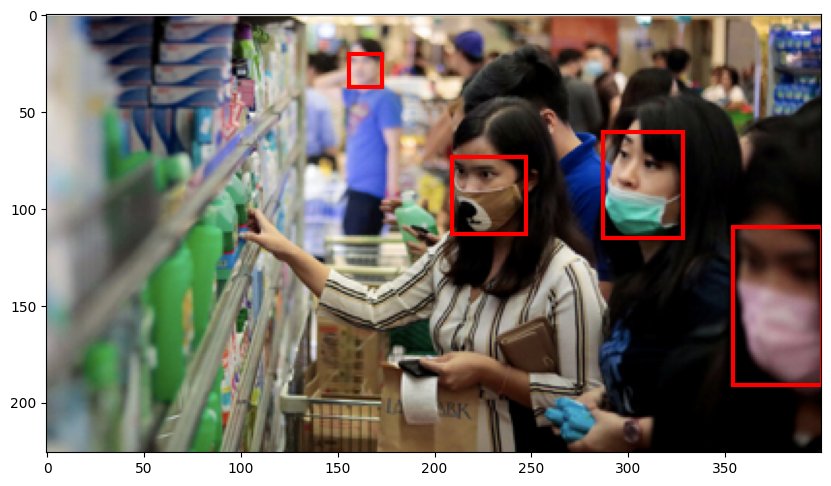

In [20]:
plot_bounding_box(image_folder=f"{ROOT}/{IMAGES}/", image_filename="maksssksksss387.png", df=xml_df)

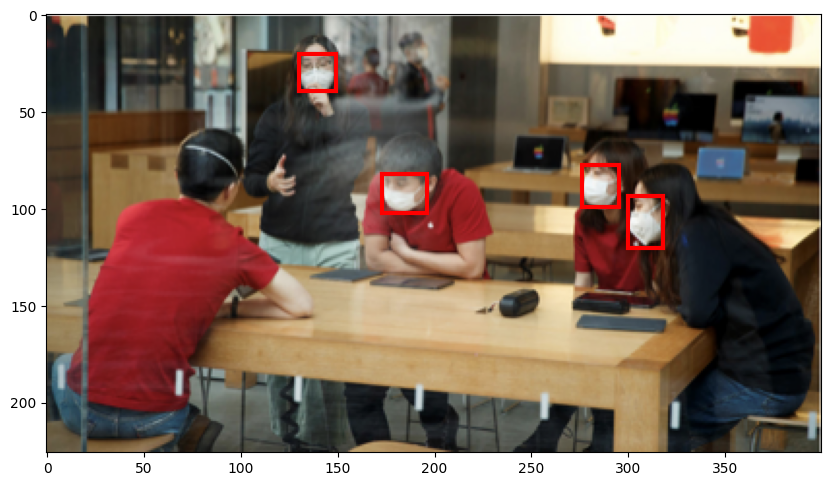

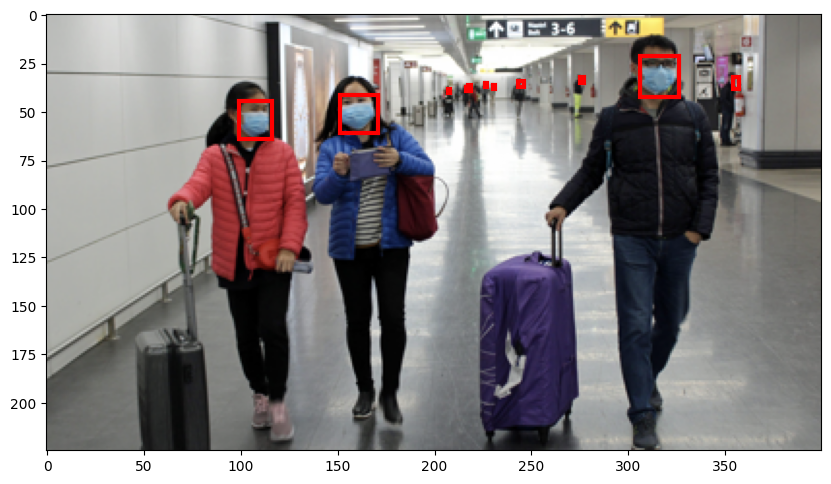

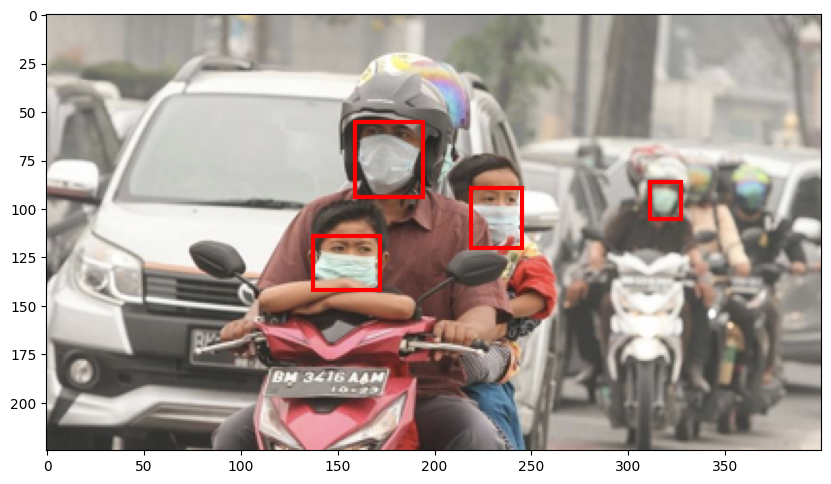

In [21]:
"""
Let's call the function plot_bounding_box() for 3 random images
"""
count = 3

for i in range(count):
    random_image_idx = np.random.choice(xml_df.shape[0])
    image_filename = xml_df.loc[random_image_idx, "filename"]
    plot_bounding_box(f"{ROOT}/{IMAGES}/", image_filename, xml_df)

***

# 2. Data Preprocessing

Classes are represented by text features:
* without_mask
* with_mask
* mask_weared_incorrect

Let's encode it by LabelEncoder. It is a class in the scikit-learn library that is used for encoding categorical (non-numeric) data into numerical labels.

In [22]:
le = preprocessing.LabelEncoder()
xml_df["label"] = le.fit_transform(xml_df["class_name"])

In [23]:
display(xml_df.head())

,filename,channels,width,height,class_name,xmin,ymin,xmax,ymax,label
0,maksssksksss504.png,3,301,400,with_mask,31,170,135,296,1
1,maksssksksss772.png,3,267,400,without_mask,45,190,80,235,2
2,maksssksksss772.png,3,267,400,without_mask,108,150,169,212,2
3,maksssksksss653.png,3,400,225,with_mask,77,69,130,112,1
4,maksssksksss653.png,3,400,225,with_mask,280,54,329,99,1


In [24]:
# Save class codes to "mapping" variable
mapping = dict(zip(le.classes_, range(len(le.classes_))))

print(mapping)

{'mask_weared_incorrect': 0, 'with_mask': 1, 'without_mask': 2}


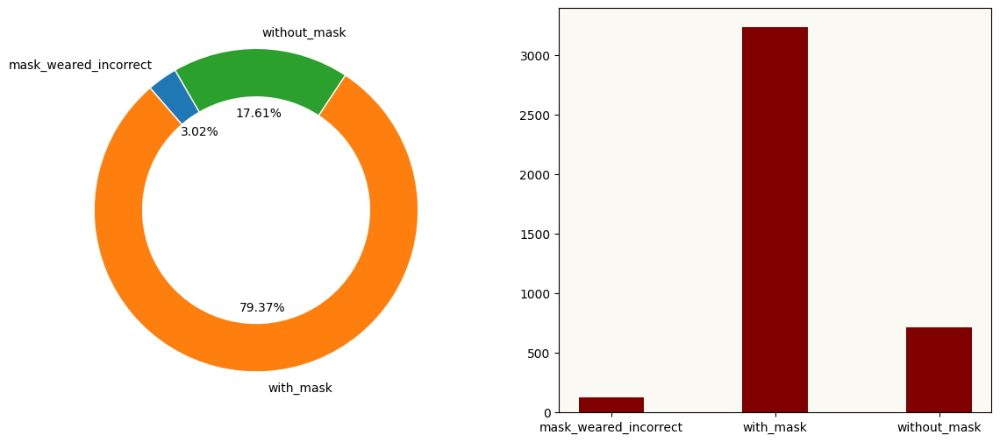

In [25]:
"""
Let's check data representations: images distribution by classes (check Imbalanced data problem)
"""
mask_weared_incorrect = xml_df[xml_df.label == 0]
with_mask = xml_df[xml_df.label == 1]
without_mask = xml_df[xml_df.label == 2]

classes_cnt = pd.DataFrame({
    "classes": ["mask_weared_incorrect", "with_mask", "without_mask"],
    "imgs_count": [mask_weared_incorrect.shape[0], with_mask.shape[0], without_mask.shape[0]]
})


# Distribution of classes_count
fig, (ax1, ax2) = plt.subplots(1, 2, figsize =(14,6))
background_color = '#faf9f4'

ax1.set_facecolor(background_color)
ax2.set_facecolor(background_color)

ax1.pie(classes_cnt["imgs_count"],wedgeprops=dict(width=0.3, edgecolor='w') ,
        labels=classes_cnt["classes"], radius=1, startangle = 120, autopct='%1.2f%%')

ax2 = plt.bar(classes_cnt["classes"], classes_cnt["imgs_count"],
              color ='maroon',width = 0.4)

plt.show()

Dataset contain images :

* with_mask : 79.37%
* mask_weared_incorrect : 3.02%
* without_mask : 17.61%

**Some observations**:
* As you can see, there are imbalanced classes. Maybe it's normal case but anyway it could be a reason of some problem at the model training stage.
    - Faster R-CNN. Note that Faster-RCNN is an Anchor-Based detector, which means number of anchors containing the object is extremely small compared to the number of total anchors. So it will be better not to deal with the imbalanced dataset. Or we can use RetinaNet which proposed a loss function called *focal loss* to improve performance upon imbalanced dataset. Or we may have to reimplement the compute_loss() method by myself to support imbalanced dataset
    - YOLO model. The recommended number of images per class is >2000. There are some ways to solve it:
        - Collect more data for other classes.
        - Try data augmentation for other classes with rotation, noise, etc.
        - Try adding synthetic images for the other classes.
        - Even though it's a bad idea to leave out data for the 1st class, at least try reducing it so there's a balanced dataset.

***

By the rule of this project I need to use two types of CV models for detection task:
* One-stage detectors - YOLO, SSD, RetinalNet
* Two-stage detectors - R-CNN (Fast, Faster, Mask)

Both of them has a rule how to create dataset before model training stage. I want to choose the next models:
* One-stage detectors: **YOLOv8** as last and better version of YOLO (https://github.com/ultralytics/ultralytics)
* Two-stage detectors: **Faster RCNN ResNet50 FPN V2** (https://github.com/hubert10/fasterrcnn_resnet50_fpn_v2_new_dataset)

# 3. Model: YOLO
The key idea of YOLO: the source image is divided into small sections (cells/samples/tiles) of size S x S pixels.

The main feature of the YOLO architecture is speed. The operating principle of this model involves inputting the entire image at once, which passes through the convolutional neural network only once (hence the name “You Only Look Once”).

# 3.1 Preparing data for YOLO model


The first step is to create a data configuration file in **YAML** format.

Dataset root directory should have the next structure:
```
dataset/
|---dataset.yaml
|---images
|   |------train
|   |    |------img1.jpg
|   |    |------img2.jpg
|   |------val
|        |------img3.jpg
         |------img4.jpg
|---labels
    |-----train
    |    |------img1.txt
    |    |------img2.txt
    |-----val
         |------img3.txt
         |------img4.txt
```

* `dataset.yaml` — data configuration file;
* `images` — folder with images:
    * `train` — training data;
    * `val` — validation data.
* `labels` — folder with annotations in .txt format:
    * `train` — training data;
    * `val` — validation data.

dataset.yaml content:

```
dataset.yaml

path: dataset # dataset root directory
train: images/train # folder with training images
val: images/val # val folder with validation images
test: # val folder with test images (empty)

names: # class name
  0: person
  1: bicycle
  2: car
  3: motorcycle
  ...
```

In [26]:
"""
Let's create dataset directory
"""
DATA_PATH = "dataset/" # dataset root directory

LABELS_PATH = os.path.join(DATA_PATH, "labels") # Folder with annotations
IMGS_PATH = os.path.join(DATA_PATH, "images") # Folder with images

TRAIN_IMAGES_PATH = os.path.join(IMGS_PATH, "train")
VAL_IMAGES_PATH = os.path.join(IMGS_PATH, "val")
TRAIN_LABELS_PATH = os.path.join(LABELS_PATH, "train")
VAL_LABELS_PATH = os.path.join(LABELS_PATH, "val")

DATA_CONFIG_PATH = os.path.join(DATA_PATH, "dataset.yaml")

print(TRAIN_IMAGES_PATH)
print(VAL_IMAGES_PATH)
print(TRAIN_LABELS_PATH)
print(VAL_LABELS_PATH)
print(DATA_CONFIG_PATH)

dataset/images/train
dataset/images/val
dataset/labels/train
dataset/labels/val
dataset/dataset.yaml


In [27]:
"""
Create folders by makedirs() function.
"""
# Create a local folder in which we will place images and annotations for them
if not os.path.exists(DATA_PATH):
    os.makedirs(DATA_PATH)

# Create a folder in which we will store training images    
if not os.path.exists(TRAIN_IMAGES_PATH):
    os.makedirs(TRAIN_IMAGES_PATH)

# СCreate a folder in which we will store training annotations
if not os.path.exists(TRAIN_LABELS_PATH):
    os.makedirs(TRAIN_LABELS_PATH)

# Create a folder in which we will store validation images
if not os.path.exists(VAL_IMAGES_PATH):
    os.makedirs(VAL_IMAGES_PATH)

# Create a folder in which we will store validation annotations
if not os.path.exists(VAL_LABELS_PATH):
    os.makedirs(VAL_LABELS_PATH)

In [28]:
"""
Let's check the structure:
"""
!ls dataset
!ls dataset/images
!ls dataset/labels

images	labels
train  val
train  val


In [29]:
"""
Adding data configuration file - dataset.yaml:
"""

data_config = f'''
path: /kaggle/working/dataset
train: images/train
val: images/val
test:
names:
    0: mask_weared_incorrect
    1: with_mask
    2: without_mask
'''

with open(DATA_CONFIG_PATH, 'w') as f:
    f.write(data_config)

# Check that everything was recorded correctly
with open(DATA_CONFIG_PATH, 'r') as f:
    print(f.read())


path: /kaggle/working/dataset
train: images/train
val: images/val
test:
names:
    0: mask_weared_incorrect
    1: with_mask
    2: without_mask



In [30]:
"""
At this stage it is necessary to fill the structure with content - images and annotations.
"""
# Class encoding
xml_df["class"] = xml_df["class_name"].map({
    "mask_weared_incorrect": 0,
    "with_mask": 1,
    "without_mask": 2})

# Calculate the normalized coordinates of the center of the bounding box
xml_df["x_center"] = (xml_df["xmin"] + xml_df["xmax"]) / (2 * xml_df["width"])
xml_df["y_center"] = (xml_df["ymin"] + xml_df["ymax"]) / (2 * xml_df["height"])

# Calculate the relative height and width of the bounding rectangle
xml_df["box_width"] = (xml_df["xmax"] - xml_df["xmin"]).abs() / xml_df["width"]
xml_df["box_height"] = (xml_df["ymax"] - xml_df["ymin"]).abs() / xml_df["height"]

# Look at the result
xml_df[["class", "x_center", "y_center", "box_width", "box_height"]].head()

,class,x_center,y_center,box_width,box_height
0,1,0.275748,0.582500,0.345515,0.315000
1,2,0.234082,0.531250,0.131086,0.112500
2,2,0.518727,0.452500,0.228464,0.155000
3,1,0.258750,0.402222,0.132500,0.191111
4,1,0.761250,0.340000,0.122500,0.200000


In [31]:
"""
Split data to training and validation by 90/10
"""
# Creating a general list of file names with images
image_ids = list(set(xml_df["filename"]))

# Split to training and validation data
train_ids, val_ids = train_test_split(image_ids, random_state=RANDOM_SEED, test_size=0.1)

print(f"Train shape: {len(train_ids)}")
print(f"Validation shape: {len(val_ids)}")

Train shape: 767
Validation shape: 86


In [32]:
"""
Folders with annotations will be filled with txt files about data format
Folders with images will be filled with images
"""
# Loop by images
for filename, mini in tqdm(xml_df.groupby("filename")):
    
    # If file is in validation data
    if filename in val_ids:
        path2save = "val"
    # If file is in training data
    else:
        path2save = "train"
        
    # Path to the file in which we will write the new annotation
    new_annotation_path = os.path.join(LABELS_PATH, path2save, filename[:-4] + ".txt")
    
    # Writing .txt file
    with open(new_annotation_path, "w+") as f:
        # Select the coordinates of the bounding rectangle in the format required for YOLO
        row = mini[["class", "x_center","y_center","box_width","box_height"]].astype(float).values
        row = row.astype(str)
        
        # Write down the coordinates of each of the bounding boxes in the image
        for j in range(len(row)):
            text = " ".join(row[j])
            f.write(text)
            f.write("\n")
            
    # Moving images from the original folder to the new folder
    sh.copy(
        os.path.join(f"{ROOT}/{IMAGES}/", filename),
        os.path.join(IMGS_PATH, path2save, filename)
    )

  0%|          | 0/853 [00:00<?, ?it/s]

In [33]:
print(os.listdir(TRAIN_LABELS_PATH)[:30])
print("\n")
print(os.listdir(TRAIN_IMAGES_PATH)[:30])

['maksssksksss229.txt', 'maksssksksss0.txt', 'maksssksksss728.txt', 'maksssksksss422.txt', 'maksssksksss429.txt', 'maksssksksss50.txt', 'maksssksksss470.txt', 'maksssksksss144.txt', 'maksssksksss197.txt', 'maksssksksss625.txt', 'maksssksksss78.txt', 'maksssksksss30.txt', 'maksssksksss804.txt', 'maksssksksss589.txt', 'maksssksksss320.txt', 'maksssksksss641.txt', 'maksssksksss635.txt', 'maksssksksss631.txt', 'maksssksksss479.txt', 'maksssksksss452.txt', 'maksssksksss315.txt', 'maksssksksss815.txt', 'maksssksksss310.txt', 'maksssksksss100.txt', 'maksssksksss845.txt', 'maksssksksss312.txt', 'maksssksksss185.txt', 'maksssksksss502.txt', 'maksssksksss617.txt', 'maksssksksss19.txt']


['maksssksksss197.png', 'maksssksksss516.png', 'maksssksksss471.png', 'maksssksksss673.png', 'maksssksksss581.png', 'maksssksksss730.png', 'maksssksksss71.png', 'maksssksksss357.png', 'maksssksksss550.png', 'maksssksksss364.png', 'maksssksksss545.png', 'maksssksksss489.png', 'maksssksksss391.png', 'maksssksksss5

1.0 0.065 0.24 0.115 0.2222222222222222
1.0 0.34125 0.38 0.0775 0.15555555555555556
1.0 0.4275 0.2222222222222222 0.035 0.08888888888888889
1.0 0.52125 0.24222222222222223 0.0675 0.13777777777777778
1.0 0.89875 0.26666666666666666 0.0375 0.07111111111111111
2.0 0.96375 0.2777777777777778 0.0325 0.07555555555555556
2.0 0.78375 0.24666666666666667 0.0425 0.08444444444444445
2.0 0.72125 0.23777777777777778 0.0375 0.08444444444444445
2.0 0.64375 0.24222222222222223 0.0425 0.1111111111111111
2.0 0.215 0.2577777777777778 0.055 0.09777777777777778
2.0 0.1575 0.2511111111111111 0.025 0.04888888888888889



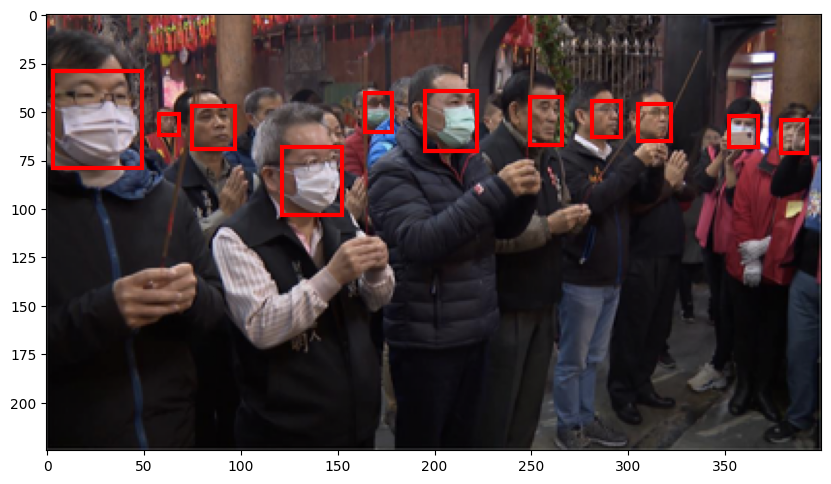

In [34]:
"""
Look at the example: "maksssksksss722.txt"
"""
with open(os.path.join(TRAIN_LABELS_PATH, "maksssksksss735.txt")) as f:
    txt_example = f.read()
    
print(txt_example)

plot_bounding_box(TRAIN_IMAGES_PATH, "maksssksksss735.png", xml_df)

In [35]:
print(len(os.listdir(TRAIN_LABELS_PATH)) == len(os.listdir(TRAIN_IMAGES_PATH)))
print(len(os.listdir(VAL_LABELS_PATH)) == len(os.listdir(VAL_IMAGES_PATH)))

True
True


We have prepared a dataset for training the model YOLO with the next structure:

```
kaggle/
|---working
|   |------dataset
|   |    |------dataset.yaml
|   |    |------images
|   |    |      |------train
|   |    |      |------val
|   |    |------labels
|   |    |      |------train
|   |    |      |------val
```

***

# 3.2 Building a detection model: Yolo8

In [36]:
%%capture
!pip install ultralytics

In [37]:
%%capture

# Cloning the repository with the model
!git clone https://github.com/ultralytics/ultralytics.git

# Installing the dependencies necessary for the model to work
!pip install -r requirements.txt

In [38]:
import ultralytics
from ultralytics import YOLO

ultralytics.checks()

Ultralytics YOLOv8.2.6 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5597.6/8062.4 GB disk)


In [39]:
!ls

'Face mask detection.csv'   face-mask-detection   ultralytics
 dataset		    requirements.txt


# 3.3 Model training

Here, we are able to pass a number of arguments:

* imgsz: define input image size
* batch: determine batch size
* epochs: define the number of training epochs
* data: set the path to our yaml file

In [40]:
!yolo train model=yolov8n.pt data=dataset/dataset.yaml epochs=40 batch=10 imgsz=640

100%|██████████████████████████████████████| 6.23M/6.23M [00:00<00:00, 69.4MB/s]
Ultralytics YOLOv8.2.6 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=dataset/dataset.yaml, epochs=40, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_

In [41]:
"""
Validation Step
"""
!ls /kaggle/working/runs/detect/train

F1_curve.png					   train_batch1.jpg
PR_curve.png					   train_batch2.jpg
P_curve.png					   train_batch2310.jpg
R_curve.png					   train_batch2311.jpg
args.yaml					   train_batch2312.jpg
confusion_matrix.png				   val_batch0_labels.jpg
confusion_matrix_normalized.png			   val_batch0_pred.jpg
events.out.tfevents.1714684093.1a38d813a544.145.0  val_batch1_labels.jpg
labels.jpg					   val_batch1_pred.jpg
labels_correlogram.jpg				   val_batch2_labels.jpg
results.csv					   val_batch2_pred.jpg
results.png					   weights
train_batch0.jpg


In [42]:
list_of_metrics = ["P_curve.png","R_curve.png","confusion_matrix.png"]

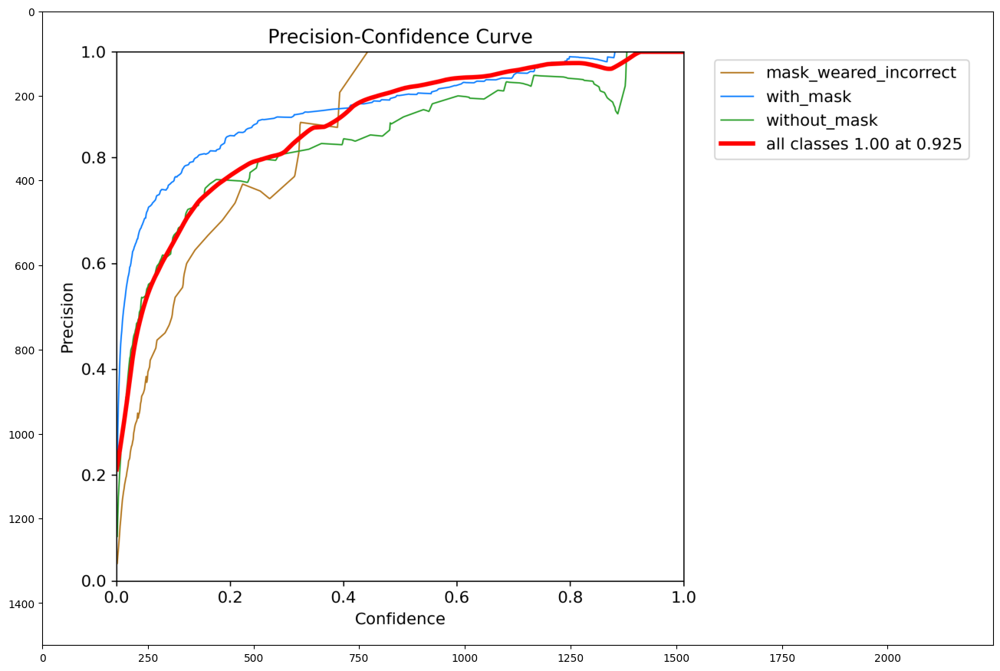

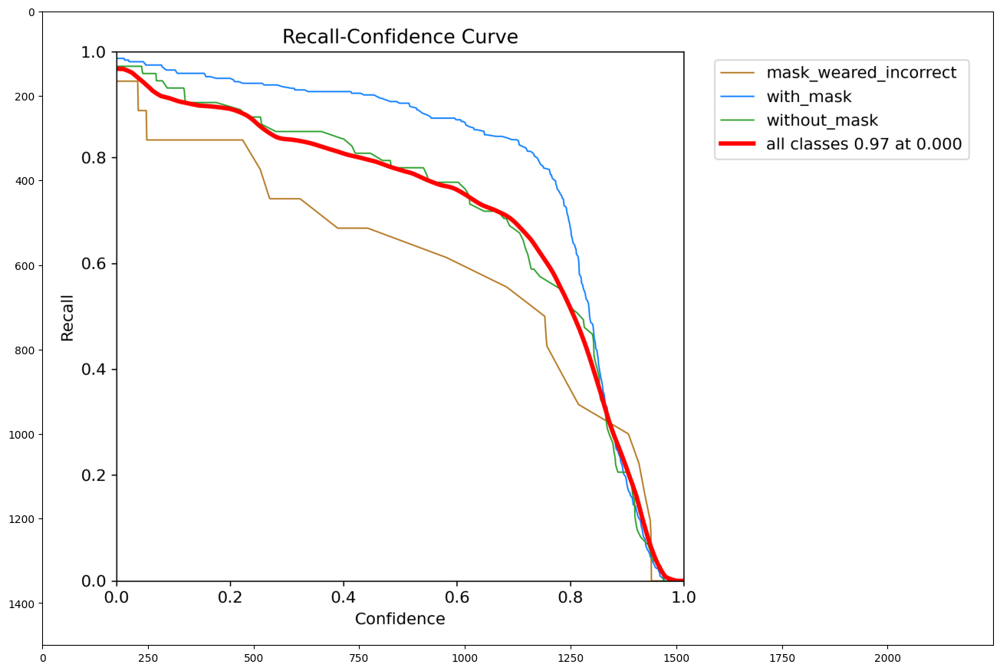

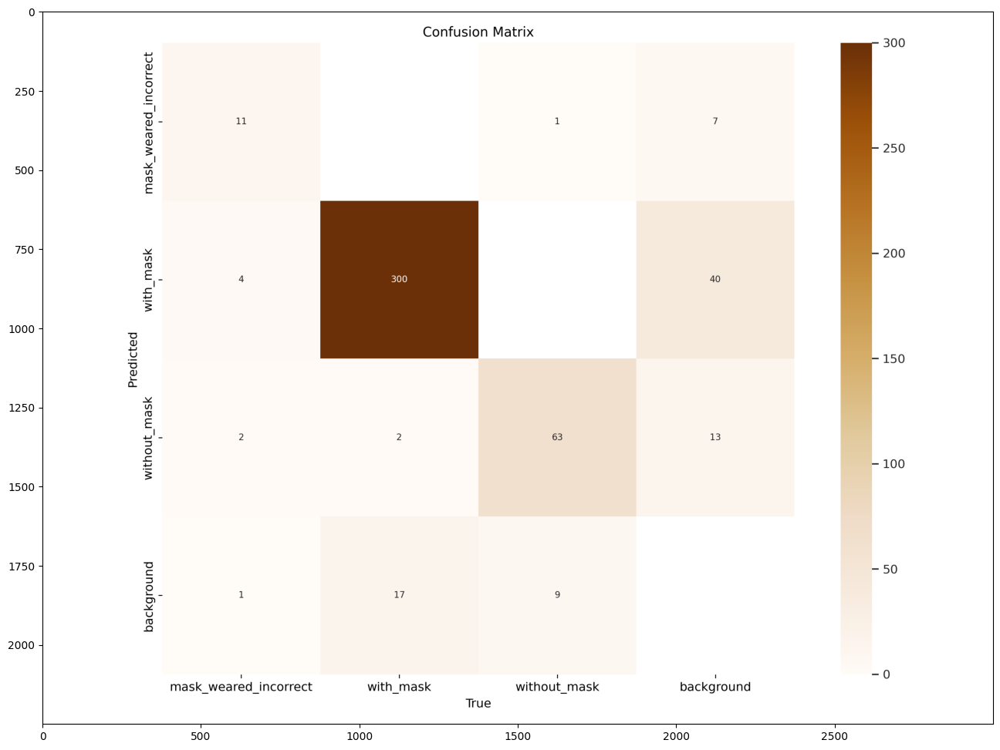

In [43]:
# Load the image
for i in list_of_metrics:
    image = cv2.imread(f"/kaggle/working/runs/detect/train/{i}")

    # Create a larger figure
    plt.figure(figsize=(16, 12))

    # Display the image
    plt.imshow(image)

    # Show the plot
    plt.show()

*Some observations:*

* **Precision-Confidence Curve** plots precision against different confidence thresholds. It shows how precision changes as the confidence level for classifying a prediction as positive.
* **Recall-Confidence Curve** shows the recall at various confidence thresholds.
* **Confusion Matrix** summarizes the performance of classification. Diagonal values represent correct predictions, while off-diagonal values indicate misclassifications.
    - As you can see model made not a lot of mistakes.

In [44]:
Result_model = pd.read_csv("/kaggle/working/runs/detect/train/results.csv")
Result_model.tail(10)

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
30,31,0.96772,0.53069,0.94822,0.88473,0.80416,0.88064,0.58289,1.00710,0.57231,0.98805,0.000368,0.000368,0.000368
31,32,0.96642,0.52043,0.95007,0.85497,0.84886,0.88951,0.58422,0.99397,0.57237,0.97505,0.000333,0.000333,0.000333
32,33,0.97834,0.52828,0.94884,0.87356,0.80405,0.88073,0.58856,0.98583,0.56668,0.97562,0.000297,0.000297,0.000297
33,34,0.96042,0.50982,0.94293,0.88238,0.77120,0.85781,0.57442,0.94704,0.56428,0.95184,0.000262,0.000262,0.000262
34,35,0.95416,0.49747,0.93524,0.84786,0.80275,0.86516,0.57954,0.95729,0.55705,0.96450,0.000227,0.000227,0.000227
35,36,0.93829,0.49038,0.93579,0.91693,0.77094,0.87203,0.57840,0.95841,0.54483,0.95812,0.000191,0.000191,0.000191
36,37,0.93047,0.48159,0.93193,0.92024,0.79422,0.90051,0.59921,0.96877,0.51990,0.95983,0.000156,0.000156,0.000156
37,38,0.91569,0.47906,0.91964,0.91556,0.79671,0.89820,0.59995,0.96541,0.51761,0.96674,0.000120,0.000120,0.000120
38,39,0.91664,0.47039,0.92292,0.93513,0.76492,0.87608,0.59119,0.95279,0.52971,0.95994,0.000085,0.000085,0.000085
39,40,0.91750,0.47678,0.92382,0.93223,0.74984,0.88371,0.59517,0.94133,0.52951,0.94944,0.000050,0.000050,0.000050


In [45]:
Result_model.columns

Index(['                  epoch', '         train/box_loss',
       '         train/cls_loss', '         train/dfl_loss',
       '   metrics/precision(B)', '      metrics/recall(B)',
       '       metrics/mAP50(B)', '    metrics/mAP50-95(B)',
       '           val/box_loss', '           val/cls_loss',
       '           val/dfl_loss', '                 lr/pg0',
       '                 lr/pg1', '                 lr/pg2'],
      dtype='object')

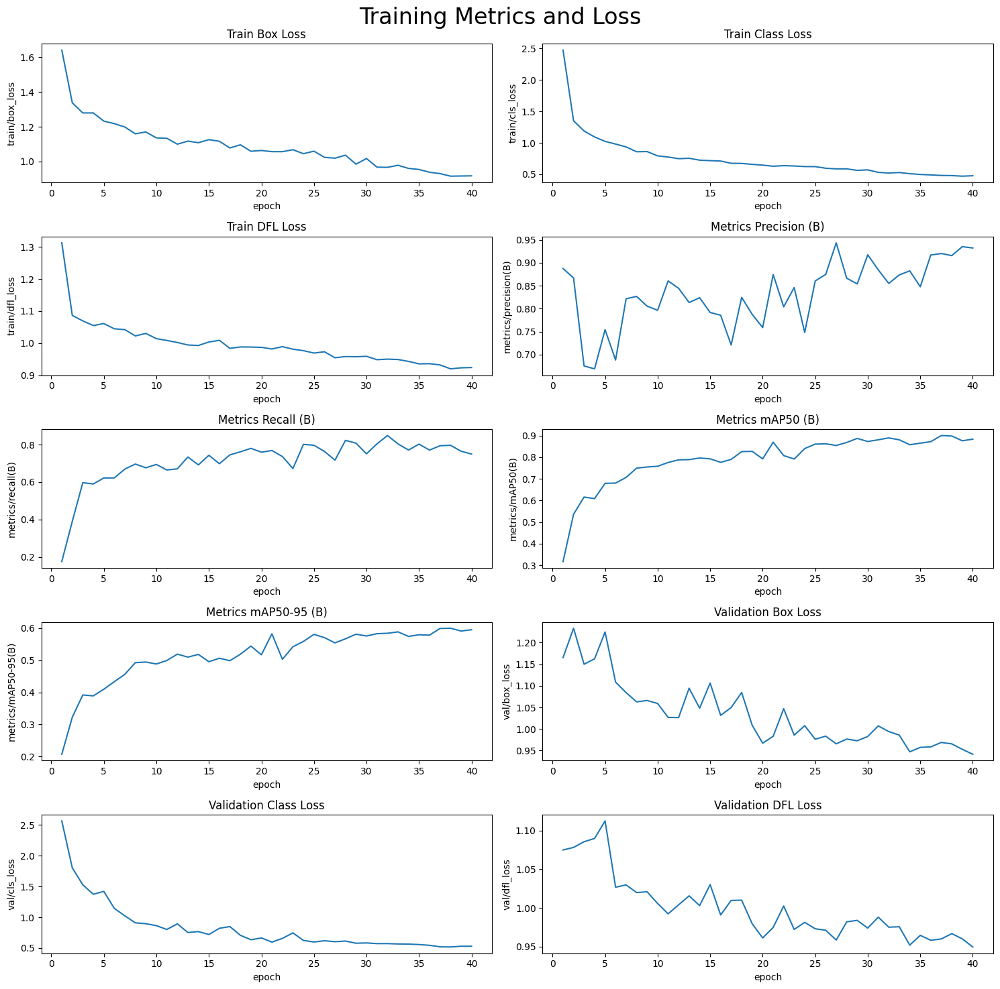

In [46]:
# Read the results.csv file as a pandas dataframe
df = Result_model.copy()
df.columns = Result_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

# 3.4 Validation result visualization

In [47]:
!ls /kaggle/working/runs/detect/train/val_batch0_labels.jpg

/kaggle/working/runs/detect/train/val_batch0_labels.jpg


GROUND TRUTH TRAINING DATA:


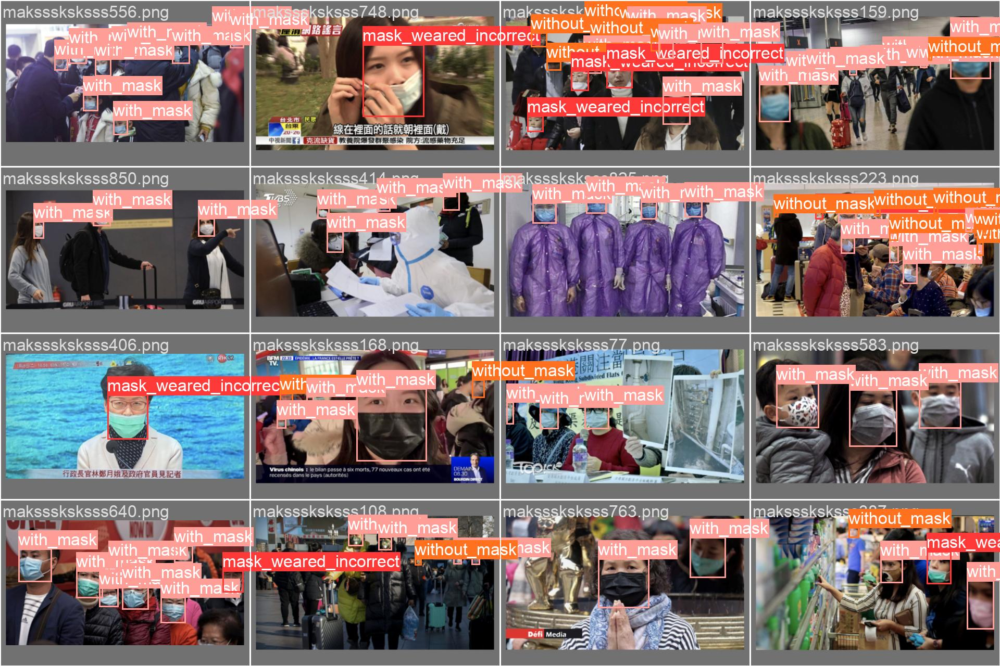

In [48]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image.open("/kaggle/working/runs/detect/train/val_batch0_labels.jpg")

In [49]:
!ls /kaggle/working/runs/detect

train



image 1/86 /kaggle/working/dataset/images/val/maksssksksss108.png: 384x640 9 with_masks, 1 without_mask, 110.5ms
image 2/86 /kaggle/working/dataset/images/val/maksssksksss110.png: 448x640 1 mask_weared_incorrect, 16 with_masks, 22 without_masks, 72.4ms
image 3/86 /kaggle/working/dataset/images/val/maksssksksss123.png: 512x640 2 with_masks, 82.5ms
image 4/86 /kaggle/working/dataset/images/val/maksssksksss132.png: 640x512 1 mask_weared_incorrect, 1 with_mask, 71.4ms
image 5/86 /kaggle/working/dataset/images/val/maksssksksss133.png: 640x512 1 with_mask, 7.0ms
image 6/86 /kaggle/working/dataset/images/val/maksssksksss138.png: 448x640 3 with_masks, 7.0ms
image 7/86 /kaggle/working/dataset/images/val/maksssksksss142.png: 480x640 1 with_mask, 70.3ms
image 8/86 /kaggle/working/dataset/images/val/maksssksksss146.png: 448x640 3 with_masks, 7.7ms
image 9/86 /kaggle/working/dataset/images/val/maksssksksss153.png: 448x640 1 with_mask, 1 without_mask, 6.4ms
image 10/86 /kaggle/working/dataset/image

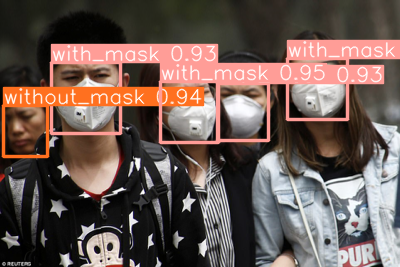

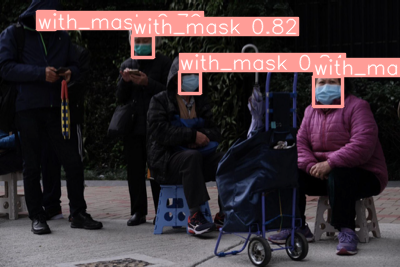

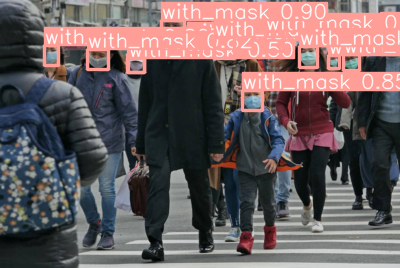

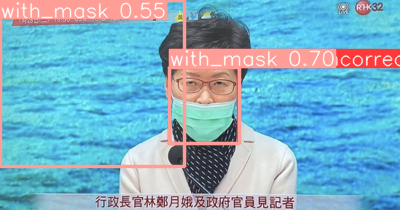

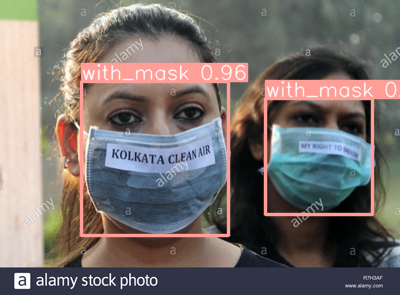

In [50]:
from IPython.display import Image

yolo8_model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")
yolo8_model.predict(source="/kaggle/working/dataset/images/val", save=True)

res_path = "/kaggle/working/runs/detect/predict"

for image in os.listdir(res_path)[-5:]:
  # print(os.path.join(res_path,image))

  display(Image(filename=os.path.join(res_path,image), height=300,width=500)) 

***

# 4. Model: FASTER CNN

# 4.1 Preparing data for model: Dataset, DataLoader

In [51]:
"""
At the first step I need to define Dataset class
"""
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe, img_dir, width=224, height=224, transform=None):
        self.dataframe = dataframe
        self.unique_filenames = dataframe["filename"].unique()
        self.img_dir = img_dir
        self.transforms = transform
        self.width = width
        self.height = height
        self.classes = [_, *dataframe["class_name"].unique()]
        self.imgs = []

        for filename in os.listdir(img_dir):
            if filename.endswith((".jpg", ".jpeg", ".png", ".gif", ".bmp")):
                self.imgs.append(filename)


    def __len__(self):
        return len(self.unique_filenames)

    def __getitem__(self, idx):
        boxes = []
        labels = []

        img_name = self.unique_filenames[idx]
        image_path = os.path.join(self.img_dir, img_name)

        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
        # normalizing image
        img_res /= 255.0

        wt = img.shape[1]
        ht = img.shape[0]

        file_annotations = self.dataframe[self.dataframe["filename"]==img_name]
        for index, row in file_annotations.iterrows():
            xmin = int(row["xmin"])
            xmax = int(row["xmax"])

            ymin = int(row["ymin"])
            ymax = int(row["ymax"])


            xmin_corr = (xmin/wt)*self.width
            xmax_corr = (xmax/wt/1.003)*self.width
            ymin_corr = (ymin/ht)*self.height
            ymax_corr = (ymax/ht)*self.height

            boxes.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
            labels.append(1 if row["class_name"] == "with_mask" else 2)
#             labels.append(1 if row["class_name"] == "with_mask" else 2 if row["class_name"] == "without_mask" else 0)
            
        if(len(file_annotations) == 0):
          # no bounding boxes
          boxes.append(torch.zeros((0, 4), dtype=torch.float32))

        # convert to torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        if self.transforms:
            if len(target['boxes']) > 0:
                try:
                    sample = self.transforms(image = img_res,
                                        bboxes = target["boxes"],
                                        labels = labels)

                    img_res = sample["image"]
                    target["boxes"] = torch.Tensor(sample["bboxes"])
                    target["labels"] = torch.as_tensor(sample["labels"], dtype=torch.int64)
                except:
                    pass

        return img_res, target


In [52]:
# Define transformations: resize, to tensor and normalize
def get_transform():
    return A.Compose([ToTensorV2(p=1.0)], bbox_params={"format": "pascal_voc", "label_fields": ["labels"]})

In [53]:
dataset = CustomDataset(dataframe=xml_df, img_dir="/kaggle/working/face-mask-detection/images", transform=get_transform())
dataset_view = CustomDataset(xml_df, "/kaggle/working/face-mask-detection/images", 600, 600)
dataset_test = CustomDataset(xml_df, "/kaggle/working/face-mask-detection/images", 600, 600, get_transform())
print("length of dataset = ", len(dataset), "\n")

length of dataset =  853 



In [54]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [55]:
# Split the dataset into training and validation sets
train_val_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_val_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_val_size, test_size]) # split to training (training and validation) dataset and test datasets

train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

# Create data loaders for training and validation
view_loader = DataLoader(dataset_view, batch_size=8, shuffle=True, num_workers=2, collate_fn=collate_fn)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [56]:
"""
Additional function to visualize images with marks and bounding box
"""

def plot_images_batch(images, targets, class_names):
    num_images = len(images)
    num_cols = 2  # Adjust the number of columns as needed
    num_rows = int(np.ceil(num_images / num_cols))

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, 16))
    fig.subplots_adjust(hspace=0.1)

    for i, ax in enumerate(axes.flatten()):
        if i < num_images:
            #img = images[i].permute(1, 2, 0).numpy()
            ax.imshow(images[i])

            # Get bounding box coordinates
            boxes = targets[i]["boxes"].numpy()
            labels = targets[i]["labels"].numpy()

            for box, label in zip(boxes, labels):
                color = ("r" if label == 1 else "g" if label == 2 else "y")
                x, y, w, h = box
                if(x == -1):
                    continue

                rect = patches.Rectangle((x , y), w  - x , h  - y , linewidth=2, edgecolor=color, facecolor="none")
                ax.add_patch(rect)

        ax.axis("off")

    plt.show()

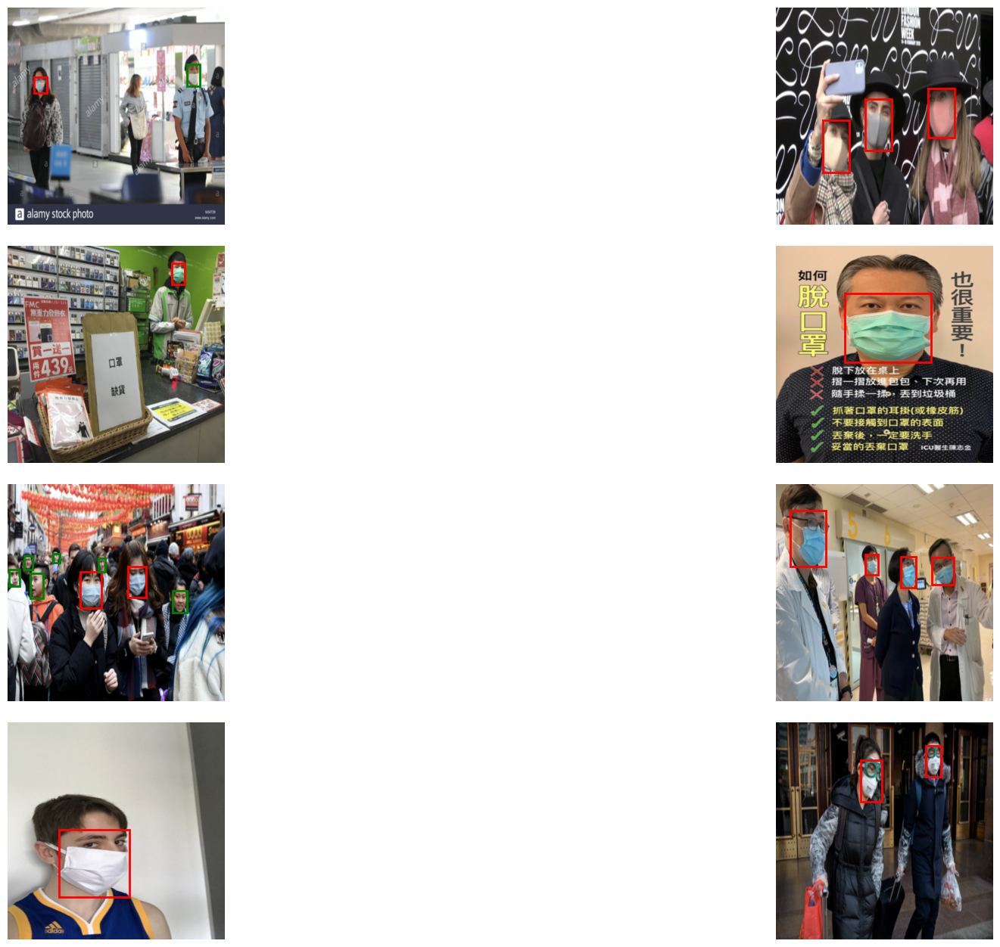

In [57]:
"""
Displaying the first batch of images with labels (in color) and rectangles
"""
# Get the first batch from the train_loader
images, targets = next(iter(view_loader))

# print("Images: ", images, targets)
# Define class names according to your dataset
class_names = xml_df["class_name"].unique()

# Plot the first batch of images with bounding boxes
plot_images_batch(images, targets, class_names)

# 4.2 Model selection and training: FasterRCNN ResNet50 FPN V2

In [58]:
num_classes = len(np.unique(xml_df["class_name"]))
print(f"Classes number: {num_classes}")

Classes number: 3


In [59]:
# model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features # Getting number of in_features for classifier
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) # Replace the classifier with a new one (3 classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100%|██████████| 167M/167M [00:01<00:00, 151MB/s]  


In [60]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [61]:
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [62]:
# # Check correct working
# images, targets = next(iter(train_loader))
# images = list(image.to(device) for image in images)

# targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
# targets

In [63]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.01)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

num_epochs = 20
early_stopping_patience = 5
best_loss = np.inf
no_improvement_counter = 0

In [64]:
frcnn_df = pd.DataFrame()

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    # training
    
    for images, targets in tqdm(train_loader):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        loss = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    print(f"Epoch: {epoch}, total loss: {epoch_loss}")
    
    # Validating model
    model.eval()
    metric = MeanAveragePrecision(box_format="xyxy", class_metrics=False)
    
    with torch.no_grad():
        for images, targets in val_loader:
            images = list(img.to(device) for img in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            preds = model(images)
            metric.update(preds, targets)
            
    metric_res = metric.compute()
    metric_res = {k: v.detach().numpy() for k, v in metric_res.items()}
    metric_res["classes"] = ["all"]
    metric_res["epoch"] = [epoch]
    frcnn_df = pd.concat([frcnn_df, pd.DataFrame(metric_res)])

    val_loss = int(epoch_loss)  # remember current loss

    # Check for early stopping
    if val_loss < best_loss:
        best_loss = val_loss
        no_improvement_counter = 0
    else:
        no_improvement_counter += 1

    if no_improvement_counter >= early_stopping_patience:
        print(f"Early stopping at epoch {epoch} as validation loss did not improve.")
        break

    lr_scheduler.step()

  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 0, total loss: 38.04759809374809


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 1, total loss: 21.11522250622511


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 2, total loss: 16.985221061855555


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 3, total loss: 14.157410454005003


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 4, total loss: 13.603472977876663


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 5, total loss: 13.373122747987509


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 6, total loss: 12.815605118870735


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 7, total loss: 13.01184768229723


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 8, total loss: 13.326747320592403


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 9, total loss: 13.059480294585228


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 10, total loss: 13.367239624261856


  0%|          | 0/69 [00:00<?, ?it/s]

Epoch: 11, total loss: 12.896377943456173
Early stopping at epoch 11 as validation loss did not improve.


## Training result

,map,map_50,map_75,map_small,map_medium,map_large,mar_1,mar_10,mar_100,mar_small,mar_medium,mar_large,map_per_class,mar_100_per_class,classes,epoch
0,0.380929,0.738220,0.341223,0.359193,0.474339,0.289109,0.188345,0.465329,0.513457,0.498861,0.577381,0.3375,-1.0,-1.0,all,0
0,0.479395,0.845962,0.500131,0.448886,0.637844,0.620462,0.233066,0.552590,0.591512,0.555985,0.729762,0.6625,-1.0,-1.0,all,1
0,0.504909,0.860979,0.544140,0.470271,0.664846,0.540099,0.238936,0.563542,0.608713,0.579614,0.724150,0.5625,-1.0,-1.0,all,2
0,0.547195,0.877710,0.585873,0.502940,0.726842,0.639604,0.256729,0.591470,0.634642,0.597735,0.779592,0.6375,-1.0,-1.0,all,3
0,0.544683,0.883277,0.583678,0.505051,0.733779,0.539604,0.258671,0.595228,0.631855,0.596079,0.777324,0.5375,-1.0,-1.0,all,4
0,0.549445,0.883210,0.585189,0.507240,0.734740,0.706436,0.264626,0.602745,0.639949,0.600642,0.790476,0.7375,-1.0,-1.0,all,5
0,0.551287,0.884271,0.597022,0.508783,0.752262,0.589604,0.260008,0.606081,0.641639,0.604082,0.792234,0.5875,-1.0,-1.0,all,6
0,0.552383,0.886709,0.596654,0.511592,0.734308,0.644295,0.264020,0.602900,0.640442,0.604280,0.780102,0.7000,-1.0,-1.0,all,7
0,0.542163,0.880779,0.571925,0.499312,0.752823,0.601980,0.265892,0.594665,0.628097,0.583385,0.807880,0.6000,-1.0,-1.0,all,8
0,0.548804,0.882897,0.592193,0.506331,0.748582,0.691584,0.261022,0.601084,0.634305,0.593159,0.793764,0.7125,-1.0,-1.0,all,9


<Axes: title={'center': 'FasterRCNN mAP_50'}, xlabel='epoch'>

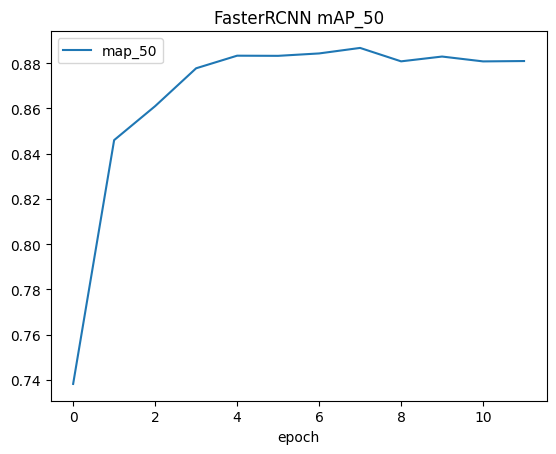

In [65]:
display(frcnn_df)
frcnn_df.plot(x="epoch", y="map_50", kind="line", title="FasterRCNN mAP_50")

# 4.3 Validation result visualization

In [66]:
"""
Prediction.
Additional functions
"""
def apply_nms(orig_prediction, iou_thresh=0.3):

    keep = torchvision.ops.nms(orig_prediction["boxes"], orig_prediction["scores"], iou_thresh)

    final_prediction = orig_prediction
    final_prediction["boxes"] = final_prediction["boxes"][keep]
    final_prediction["scores"] = final_prediction["scores"][keep]
    final_prediction["labels"] = final_prediction["labels"][keep]

    return final_prediction

def torch_to_pil(img):
    return transforms.ToPILImage()(img).convert("RGB")

In [67]:
img, target = test_dataset[random.randint(0, len(test_dataset) - 1)]

model.eval()

with torch.no_grad():
    prediction = model([img.to(device)])[0]

print("predicted #boxes: ", len(prediction["labels"]))
print("real #boxes: ", len(target["labels"]))

predicted #boxes:  2
real #boxes:  1


In [68]:
def plot_image(img_tensor, annotation, predict=True):

    fig, ax = plt.subplots(1)
    fig.set_size_inches(12.5, 6.5)
    img = img_tensor.cpu().data
    mask_dic = {1:'without_mask', 2:'with_mask'}
    color_dict = {'without_mask': 'r', 'with_mask': 'g'}

    ax.imshow(img.permute(1, 2, 0))
    ax.set_title('Prediction' if predict else 'Target')

    annotation = {k: v.detach().to('cpu') for k, v in annotation.items()}

    for i,box in enumerate(annotation["boxes"]):

        xmin, ymin, xmax, ymax = box
        label = mask_dic[int(annotation['labels'][i].data)]

        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor=color_dict[label],facecolor='none')

        ax.add_patch(rect)

        if predict:
            score = int((annotation['scores'][i].data) * 100)
            ax.text(xmin, ymin, f"{score}%", horizontalalignment='center', verticalalignment='center',fontsize=20,color=color_dict[label])
    plt.show()

In [69]:
"""
Making predictions
"""
# ake the first example from the test_loader
for imgs, targets in test_loader:
        imgs = list(img.to(device) for img in imgs)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        break

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


In [70]:
with torch.no_grad():
    preds = model(imgs)

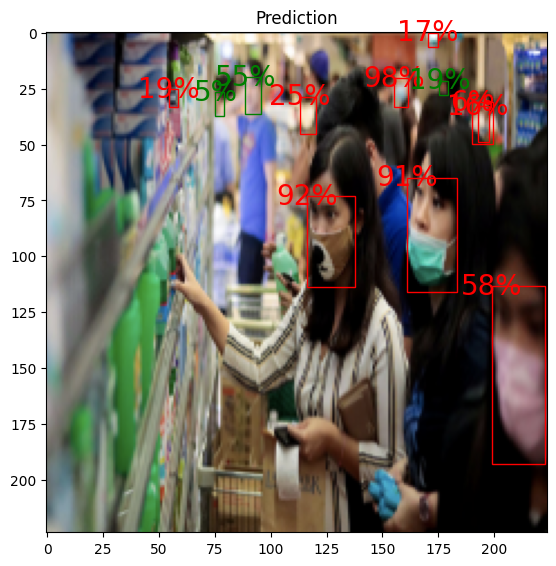

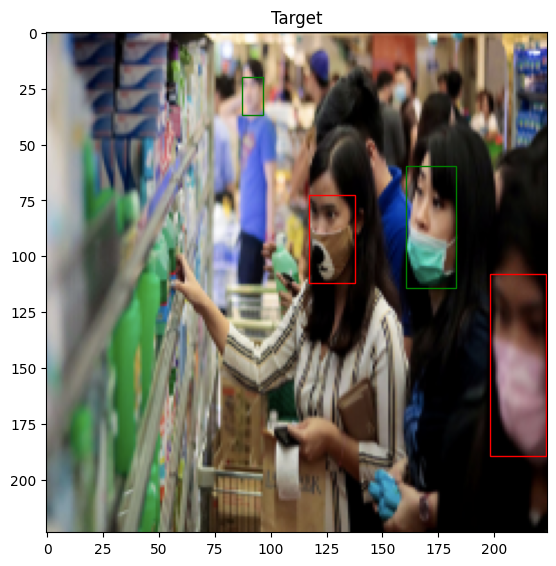

In [71]:
"""
Displaying predictions
"""
nms_prediction = apply_nms(preds[4], iou_thresh=0.7)

plot_image(imgs[4], nms_prediction)
plot_image(imgs[4].to('cpu'), targets[4], False)

***

SOME OBSERVATIONS:

* Training on GPU (Kaggle resources)
* YOLO model training time is faster than Faster R-CNN

    - YOLO8: 40 epochs about 10 min,
    - Faster R-CNN: 12 epochs about 30 min (with early stopping)
    
    
* YOLO8 model: mAP50 for all classes - 0.898. mAP50 is different for each classes - 0.839 (mask_weared_incorrect) - 0.96 (with_mask). The reason of this situation is imbalance data.

* Faster R-CNN model: mAP50 at the last epoch is 0.88. 

* YOLO8 model more accurately detects objects in photos than Faster R-CNN.